In [1]:
#### CA01 House Price Prediction

# Repository 
#https://github.com/LanceRoyston/Intro-to-Machine-Learning-BSAN-6070-02.git

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
from scipy import stats
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.impute import SimpleImputer


# Initial Viewing of entire DataFrame

pd.set_option('display.max_columns', 81) #81 Columns
pd.set_option('display.max_rows', 1460) # 1460 Records
df = pd.read_csv('https://raw.githubusercontent.com/ArinB/MSBA-CA-Data/main/CA01/house-price-train.csv')

# Saving Copy of Original Data
df.to_csv('house-price-train.csv', index=False)

df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NaN,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,Gas

In [2]:
# Check Data Types
data_types = df.info()

print(data_types)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [3]:
#### Part 1. Data Understanding

## Univatiation Analysis

# Check Summary Stats for numerical data
df.describe()


,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


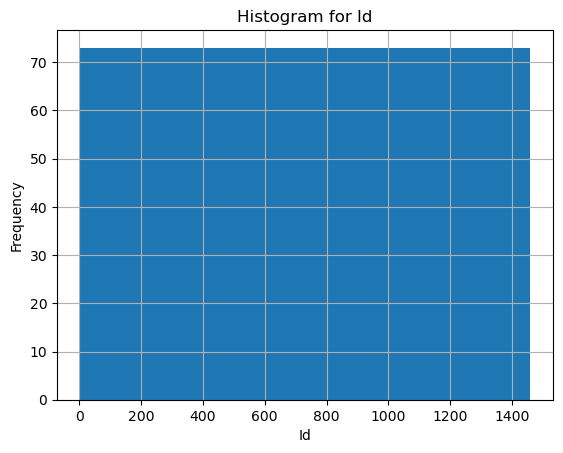

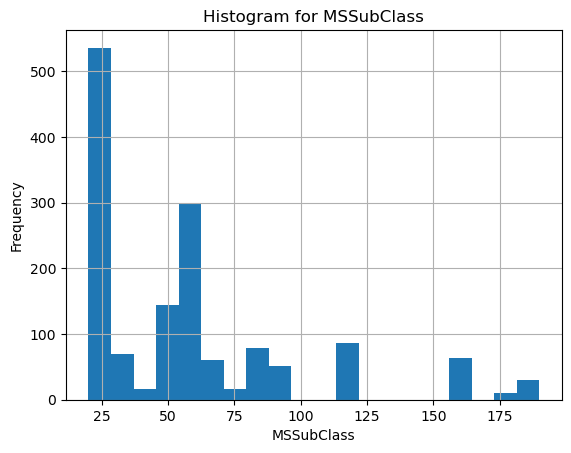

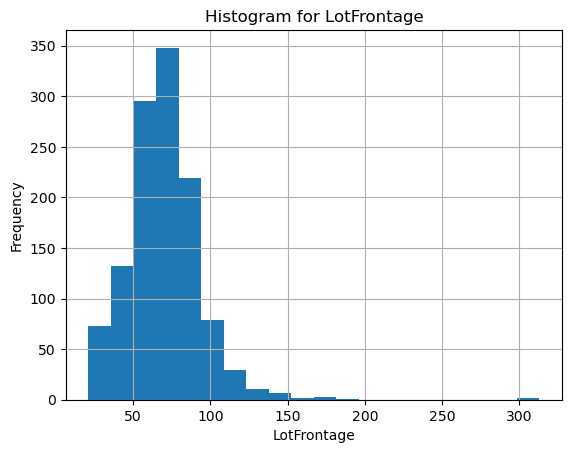

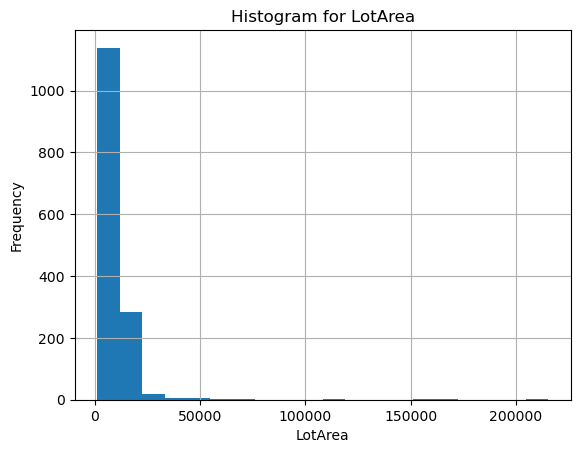

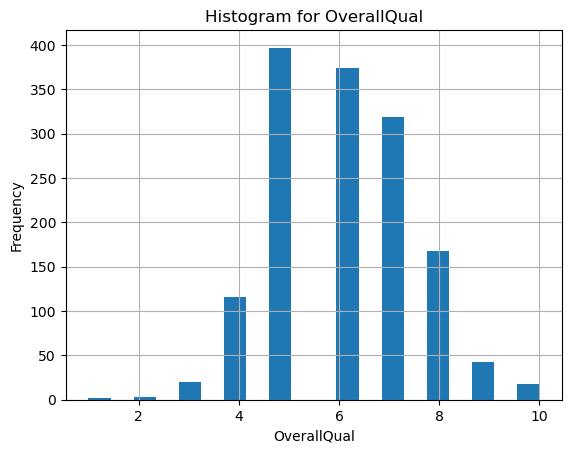

...

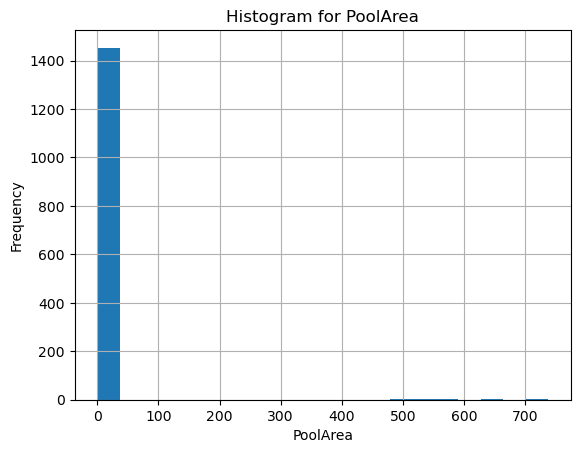

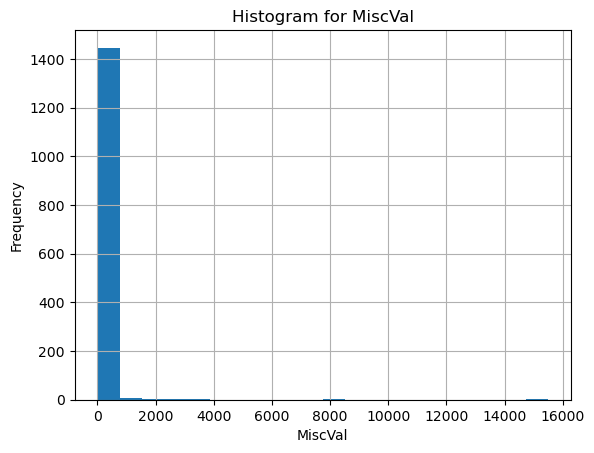

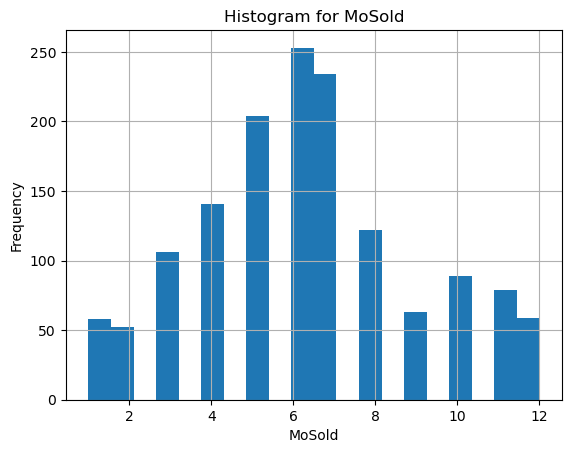

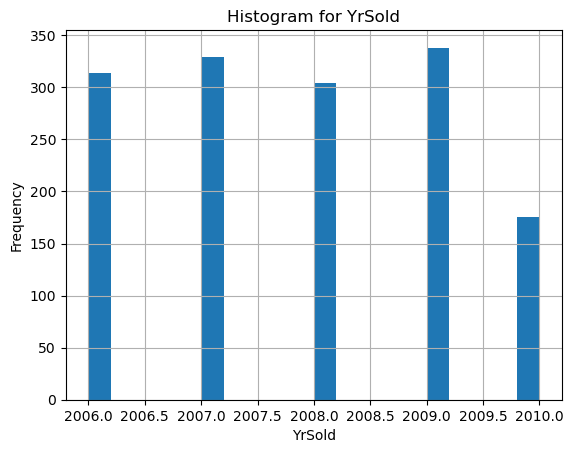

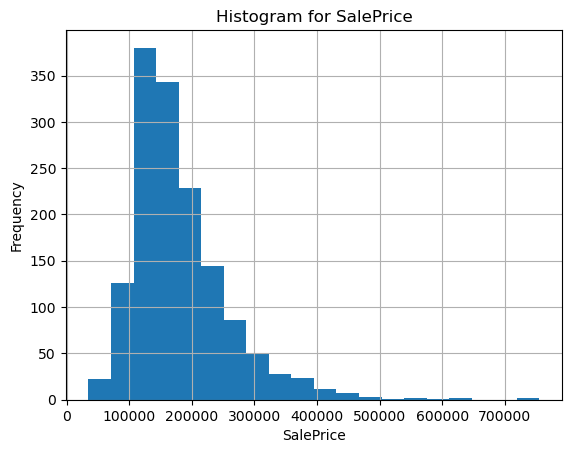

In [4]:
# Visualize distribution of all numerical data with Histograms
desc = df.describe()

for column in desc.columns:
    plt.figure()
    df[column].hist(bins=20)
    plt.title(f'Histogram for {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()



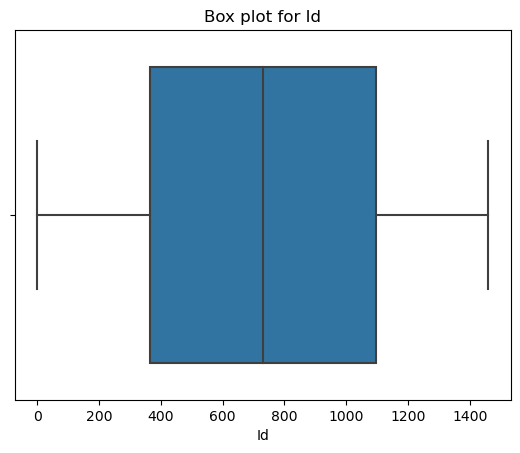

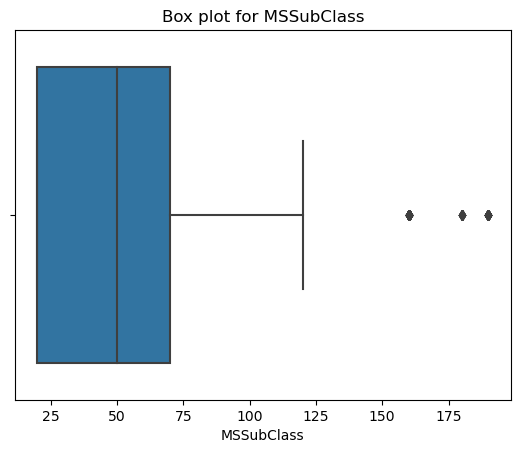

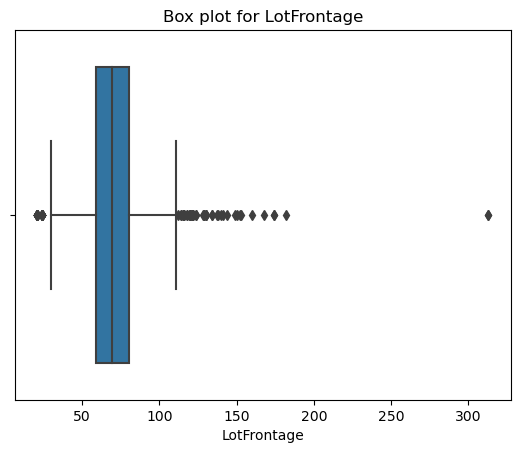

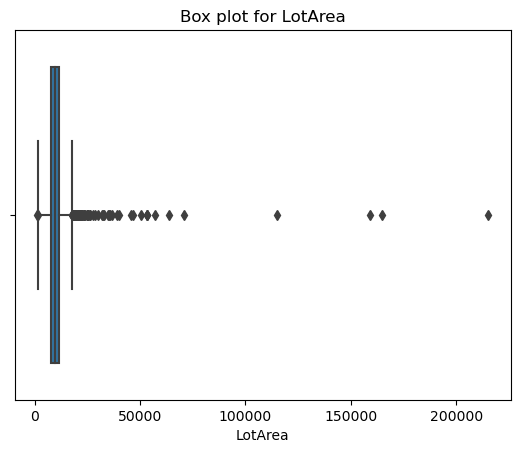

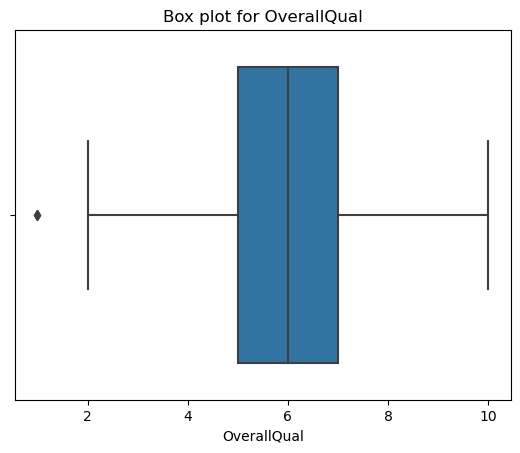

...

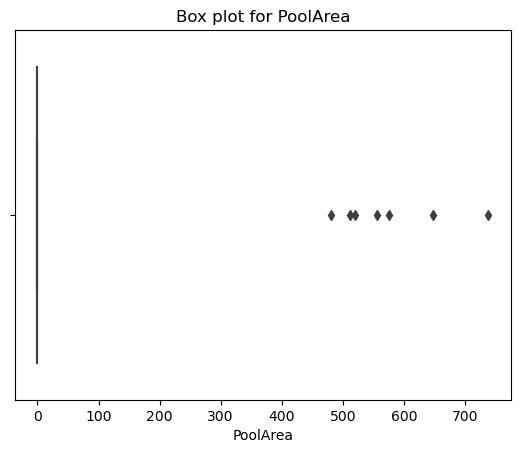

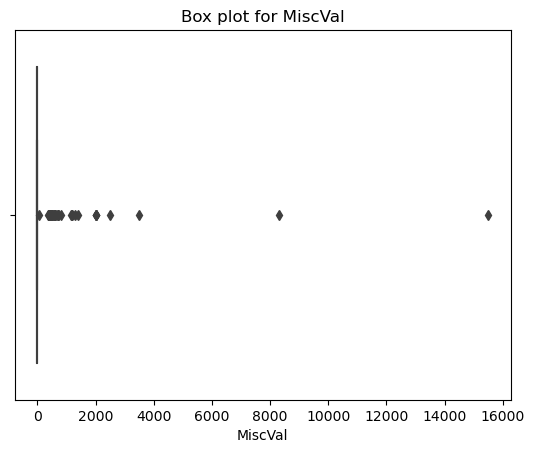

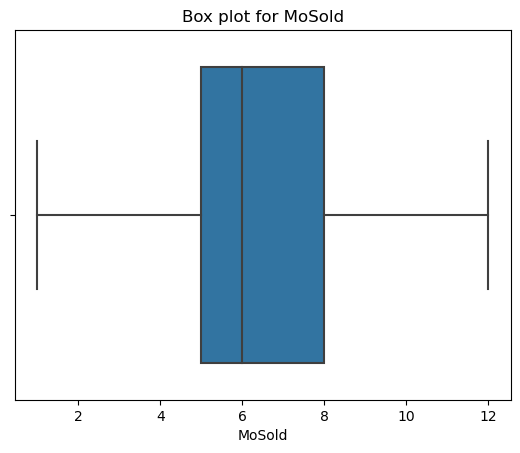

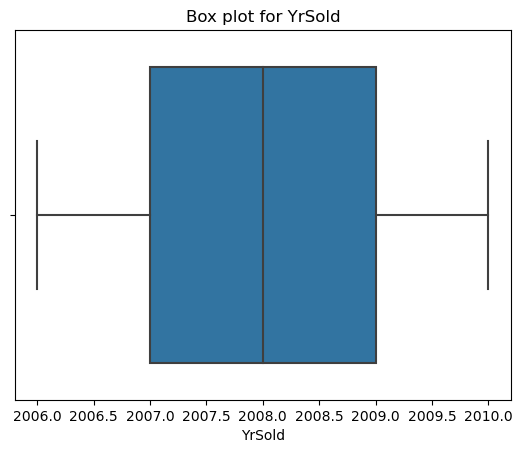

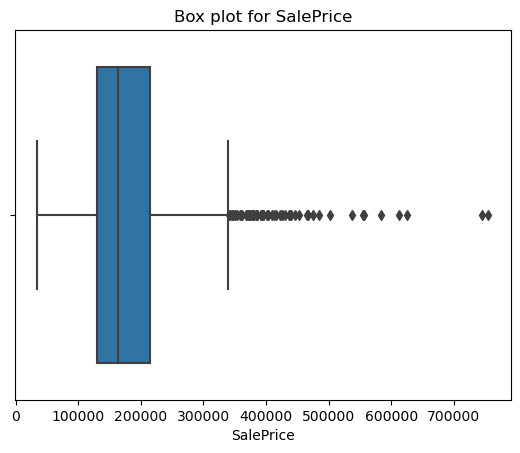

In [5]:
# Visualize Potential Outliers of Numerical Data with Box Plots
for column in desc.columns:
    plt.figure()
    sns.boxplot(x=df[column])
    plt.title(f'Box plot for {column}')
    plt.show()



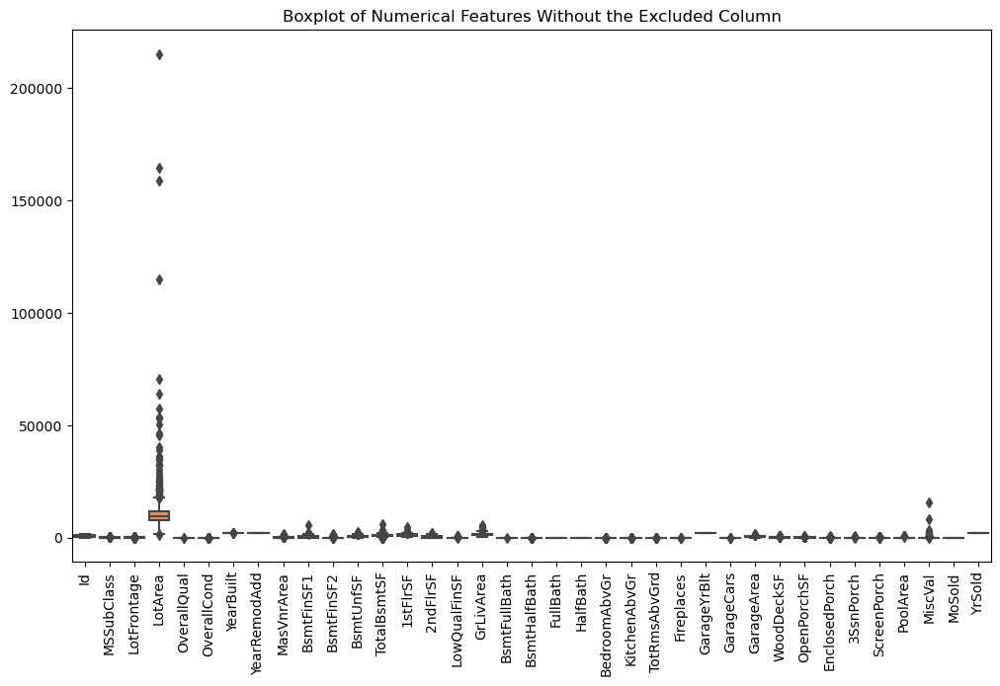

In [6]:
# Check for variables that need normalization / standardization

# Excluding Target column
df_subset = df.drop('SalePrice', axis=1)

# Boxplot with the subset of the DataFrame
plt.figure(figsize=(12, 7))
sns.boxplot(data=df_subset)
plt.xticks(rotation=90)
plt.title('Boxplot of Numerical Features Without the Excluded Column')
plt.show()

/var/folders/_6/zbtvk12j6_v27g0v5ghn4ty40000gn/T/ipykernel_14035/1586210393.py:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


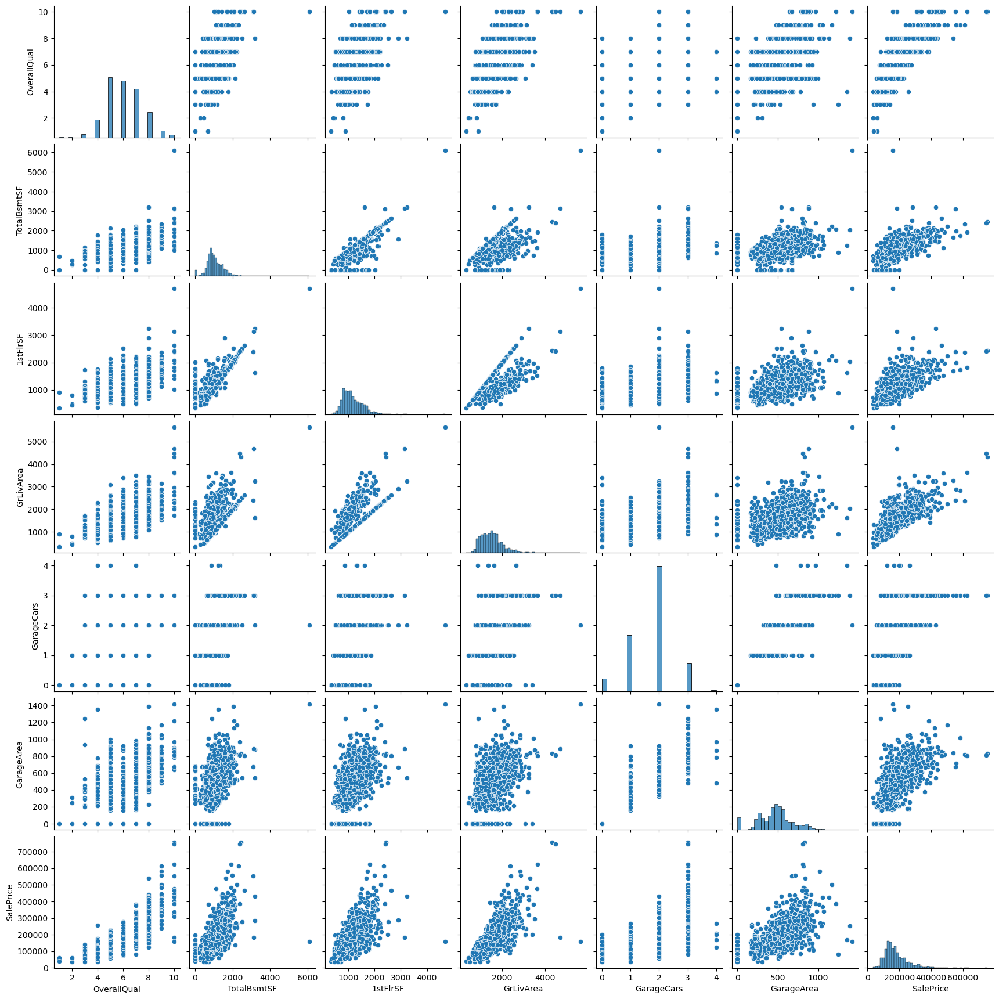

In [7]:
## Bivariation / Multivariation Analysis and Visualization
# For SalePrice and any correlated variables assuming 'SalePrice' is the column of interest

corr_matrix = df.corr()

# Setting a threshold for selecting correlated features 
threshold = 0.6


# Finding features that have a correlation above the threshold with 'SalePrice'
high_corr_features = corr_matrix.index[corr_matrix['SalePrice'] > threshold].tolist()


# Check if high_corr_features is not empty
if high_corr_features:
        
    #Create pairplot with the selected features
    sns.pairplot(df, vars=high_corr_features)
        
     # Saving High Res image for easier viewing
    plt.savefig('SalePrice_pairplot_high_res.png', dpi=300)
        
    plt.show()
else:
    print("No highly correlated features found.")
    
    


In [8]:
# Summarize the Categorical Data
df.describe(include='object')


,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
count,1460,1460,91,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1452,1460,1460,1460,1423,1423,1422,1423,1422,1460,1460,1460,1459,1460,1460,770,1379,1379,1379,1379,1460,7,281,54,1460,1460
unique,5,2,2,4,4,2,5,3,25,9,8,5,8,6,8,15,16,4,4,5,6,4,4,4,6,6,6,5,2,5,4,7,5,6,3,5,5,3,3,4,4,9,6
top,RL,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,PConc,TA,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Gd,Attchd,Unf,TA,TA,Y,Gd,MnPrv,Shed,WD,Normal
freq,1151,1454,50,925,1311,1459,1052,1382,225,1260,1445,1220,726,1141,1434,515,504,864,906,1282,647,649,1311,953,430,1256,1428,741,1365,1334,735,1360,380,870,605,1311,1326,1340,3,157,49,1267,1198


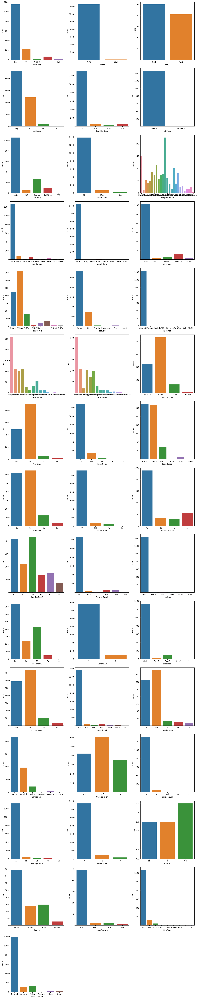

In [9]:
# Visualize Categorical Data for exploration

categorical_columns = df.select_dtypes(include=['object', 'category']).columns

# Set the number of columns for subplot grid
ncols = 3
nrows = int(np.ceil(len(categorical_columns) / ncols))

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*5, nrows*5))

for i, col in enumerate(categorical_columns):
    ax = axes.flatten()[i]
    sns.countplot(x=col, data=df, ax=ax)

# Hide any empty subplot spaces
for ax in axes.flatten()[i+1:]:
    ax.remove()

plt.tight_layout()
plt.show()


In [10]:
# ANOVA for Categorical variables vs SalePrice
categorical_columns = df.select_dtypes(include=['object', 'category']).columns

anova_results = {}

for col in categorical_columns:
    groups = df.groupby(col)['SalePrice'].apply(list)
    f_val, p_val = stats.f_oneway(*groups)
    anova_results[col] = {'F-Statistic': f_val, 'p-value': p_val}

# DataFrame for better visualization
anova_df = pd.DataFrame(anova_results).T

anova_df

,F-Statistic,p-value
MSZoning,43.840282,8.817634e-35
Street,2.459290,1.170486e-01
Alley,35.562060,4.899826e-08
LotShape,40.132852,6.447524e-25
LandContour,12.850188,2.742217e-08
Utilities,0.298804,5.847168e-01
LotConfig,7.809954,3.163167e-06
LandSlope,1.958817,1.413964e-01
Neighborhood,71.784865,1.558600e-225
Condition1,6.118017,8.904549e-08


In [11]:
# Check for Missing Values
df.isnull().sum()


Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [ ]:
'''
DATA QUALITY REPORT
-------------------------------------------------------------------------------------------------------------------

1. Missing Values
Several columns in the dataset have missing values, some with a significant proportion missing. 

The top columns with missing data are:

PoolQC:      1453 missing values - Categorical
MiscFeature: 1406 missing values - Categorical
Alley:       1369 missing values - Categorical
Fence:       1179 missing values - Categorical
FireplaceQu: 690  missing values - Categorical


Others with fewer missing values:

LotFrontage: 259 missing values - Numerical
BsmtQual     37  missing values - Categorical
BsmtCond     37  missing values - Categorical
BsmtExposure 38  missing values - Categorical
BsmtFinType1 37  missing values - Categorical
BsmtFinType2 38  missing values - Categorical
GarageType   81  missing values - Categorical 
GarageYrBlt  81  missing values - Numerical
GarageFinish 81  missing values - Categorical
GarageQual   81  missing values - Categorical
GarageCond   81  missing values - Categorical

Will remove top columns with ~ >50% missing values and impute the rest

-------------------------------------------------------------------------------------------------------------------

2. Data Types
The dataset consists of a mix of data types:

Numerical (both continuous and discrete)
Categorical (object type)

Proper encoding of categorical variables will be necessary for machine learning models.

-------------------------------------------------------------------------------------------------------------------

3. Outliers
LotArea has a maximum value of 215,245, which is significantly higher than the 75th percentile (11,601.5).


Regarding Normalization and Standardization:
MSSubClass, LotFrontage, and other variables also show wide ranges.

Needs further investigation.

-------------------------------------------------------------------------------------------------------------------

4. Consistency and Validity
For categorical data, no unexpected values in a nominal category and 
validity (e.g., values make sense for the given column).

-------------------------------------------------------------------------------------------------------------------

5. Features
Six numerical variables shown to have correlation with SalePrice (Assuming this is the target variable) 
with threshold of 0.6

Numerical Variables are:

GarageArea
GarageCars
GrLivArea
1stFlrSF
TotalBsmtSF
OverallQual

Several Categorical Variables stick out from the ANOVA, but further analysis is needed to understand significance

Categorical Variables are:

GarageFinish
KitchenQual
BsmtQual
ExterQual


These features might be useful to look into for future feature selection

In [12]:
#### Part 2. Addressing Data Quality

# Handling Missing Values - Dropping Columns
df.drop(['PoolQC', 'MiscFeature', 'Alley','Fence','FireplaceQu'], axis=1, inplace=True)



In [13]:
# Check for success
df.isnull().sum()


Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
Street             0
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         8
MasVnrArea         8
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinSF1         0
BsmtFinType2      38
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath       0
BsmtHalfBath 

In [14]:
# Imputing Numerical Missing Values

num_df = df.select_dtypes(include=[np.number])  # Select only numeric columns
imputer = SimpleImputer(strategy='mean')
num_df_imputed = pd.DataFrame(imputer.fit_transform(num_df), columns=num_df.columns)
df[num_df.columns] = num_df_imputed


In [15]:
# Check for success
df.isnull().sum()

Id                0
MSSubClass        0
MSZoning          0
LotFrontage       0
LotArea           0
Street            0
LotShape          0
LandContour       0
Utilities         0
LotConfig         0
LandSlope         0
Neighborhood      0
Condition1        0
Condition2        0
BldgType          0
HouseStyle        0
OverallQual       0
OverallCond       0
YearBuilt         0
YearRemodAdd      0
RoofStyle         0
RoofMatl          0
Exterior1st       0
Exterior2nd       0
MasVnrType        8
MasVnrArea        0
ExterQual         0
ExterCond         0
Foundation        0
BsmtQual         37
BsmtCond         37
BsmtExposure     38
BsmtFinType1     37
BsmtFinSF1        0
BsmtFinType2     38
BsmtFinSF2        0
BsmtUnfSF         0
TotalBsmtSF       0
Heating           0
HeatingQC         0
CentralAir        0
Electrical        1
1stFlrSF          0
2ndFlrSF          0
LowQualFinSF      0
GrLivArea         0
BsmtFullBath      0
BsmtHalfBath      0
FullBath          0
HalfBath          0


In [16]:
# Imputing Categorical Missing Values

cat_df = df.select_dtypes(include=['object', 'category'])  
cat_imputer = SimpleImputer(strategy='most_frequent')  # used most frequent to impute
cat_df_imputed = pd.DataFrame(cat_imputer.fit_transform(cat_df), columns=cat_df.columns)
df[cat_df.columns] = cat_df_imputed 


In [17]:
# Check for success
df.isnull().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual 

In [18]:
## Handling Outliers

def remove_outliers(df, multiplier=3):
    # New DataFrame to hold the filtered data
    df_filtered = df.copy()
    
    # Looping over each numerical column
    for column in df.select_dtypes(include=[np.number]).columns:
        # Calculating Q1 and Q3, then the IQR
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        
        # Defining bounds for outliers
        lower_bound = Q1 - multiplier * IQR
        upper_bound = Q3 + multiplier * IQR
        
        # Removing outliers outside the bounds
        df_filtered = df_filtered[(df_filtered[column] >= lower_bound) & (df_filtered[column] <= upper_bound)]
    
    return df_filtered

df = remove_outliers(df, multiplier=2)# 2 was chosen as a conservative multiplier


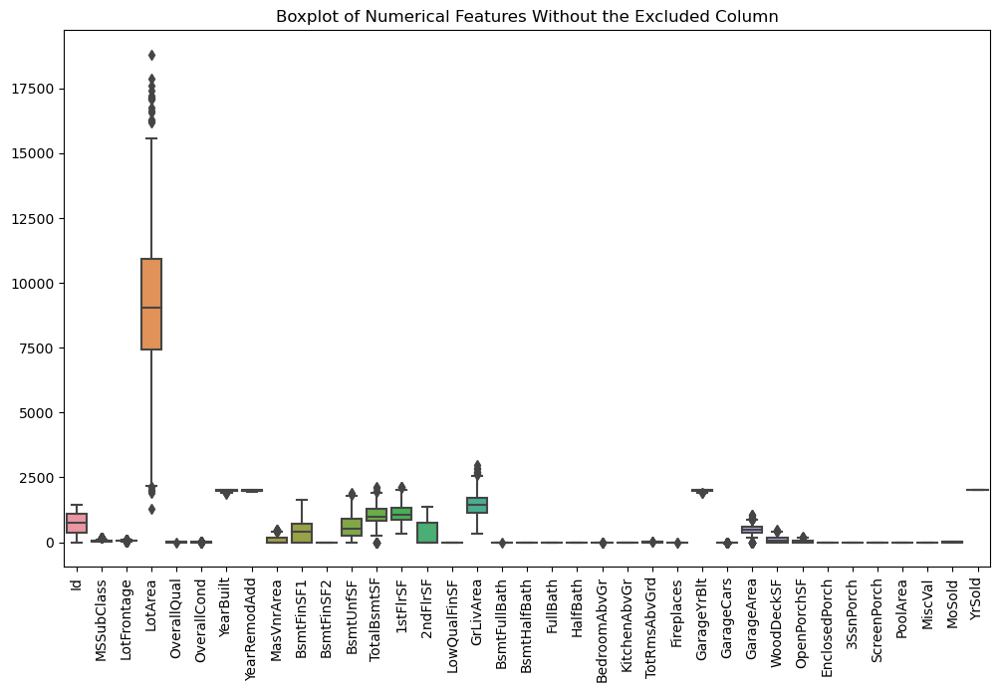

In [19]:
# Re-Visualize
df_subset = df.drop('SalePrice', axis=1)

plt.figure(figsize=(12, 7))
sns.boxplot(data=df_subset)
plt.xticks(rotation=90)
plt.title('Boxplot of Numerical Features Without the Excluded Column')
plt.show()

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 705 entries, 0 to 1455
Data columns (total 76 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             705 non-null    float64
 1   MSSubClass     705 non-null    float64
 2   MSZoning       705 non-null    object 
 3   LotFrontage    705 non-null    float64
 4   LotArea        705 non-null    float64
 5   Street         705 non-null    object 
 6   LotShape       705 non-null    object 
 7   LandContour    705 non-null    object 
 8   Utilities      705 non-null    object 
 9   LotConfig      705 non-null    object 
 10  LandSlope      705 non-null    object 
 11  Neighborhood   705 non-null    object 
 12  Condition1     705 non-null    object 
 13  Condition2     705 non-null    object 
 14  BldgType       705 non-null    object 
 15  HouseStyle     705 non-null    object 
 16  OverallQual    705 non-null    float64
 17  OverallCond    705 non-null    float64
 18  YearBuilt

In [ ]:
## Encoding List
'''
Nominal Variables:

MSZoning 
Street
Neighborhood 
Condition1 
Condition2 
BldgType
HouseStyle 
RoofStyle 
RoofMatl
Exterior1st 
Exterior2nd 
MasVnrType 
Foundation 
Heating
CentralAir 
GarageType 
SaleType
SaleCondition


Ordinal Variables:

LotShape: 
Utilities: 
LandSlope: 
ExterQual 
ExterCond: 
BsmtQual
BsmtCond: 
BsmtExposure: 
BsmtFinType1 
BsmtFinType2: 
HeatingQC: 
Electrical: 
KitchenQual: 
Functional: 
GarageFinish: 
GarageQual 
GarageCond: 

'''

In [21]:
## Encoding for Nominal Variables
# Label Encoding
!pip install category_encoders

from sklearn.preprocessing import LabelEncoder

dfcopy=df

nominal_columns = [
    'MSZoning', 
'Street',
'Neighborhood', 
'Condition1', 
'Condition2', 
'BldgType',
'HouseStyle', 
'RoofStyle', 
'RoofMatl',
'Exterior1st', 
'Exterior2nd', 
'MasVnrType', 
'Foundation', 
'Heating',
'CentralAir', 
'GarageType', 
'SaleType',
'SaleCondition',
'LotConfig'
]

label_encoder = LabelEncoder()


for col in nominal_columns:
    df[col] = label_encoder.fit_transform(df[col].astype(str))

df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1.0,60.0,3,65.000000,8450.0,1,Reg,Lvl,AllPub,4,Gtl,5,2,1,0,3,7.0,5.0,2003.0,2003.0,1,0,8,10,1,196.000000,Gd,TA,2,Gd,TA,No,GLQ,706.0,Unf,0.0,150.0,856.0,1,Ex,1,SBrkr,856.0,854.0,0.0,1710.0,1.0,0.0,2.0,1.0,3.0,1.0,Gd,8.0,Typ,0.0,0,2003.000000,RFn,2.0,548.0,TA,TA,Y,0.0,61.0,0.0,0.0,0.0,0.0,0.0,2.0,2008.0,8,4,208500.0
2,3.0,60.0,3,68.000000,11250.0,1,IR1,Lvl,AllPub,4,Gtl,5,2,1,0,3,7.0,5.0,2001.0,2002.0,1,0,8,10,1,162.000000,Gd,TA,2,Gd,TA,Mn,GLQ,486.0,Unf,0.0,434.0,920.0,1,Ex,1,SBrkr,920.0,866.0,0.0,1786.0,1.0,0.0,2.0,1.0,3.0,1.0,Gd,6.0,Typ,1.0,0,2001.000000,RFn,2.0,608.0,TA,TA,Y,0.0,42.0,0.0,0.0,0.0,0.0,0.0,9.0,2008.0,8,4,223500.0
4,5.0,60.0,3,84.000000,14260.0,1,IR1,Lvl,AllPub,2,Gtl,15,2,1,0,3,8.0,5.0,2000.0,2000.0,1,0,8,10,1,350.000000,Gd,TA,2,Gd,TA,Av,GLQ,655.0,Unf,0.0,490.0,1145.0,1,Ex,1,SBrkr,1145.0,1053.0,0.0,2198.0,1.0,0.0,2.0,1.0,4.0,1.0,Gd,9.0,Typ,1.0,0,2000.000000,RFn,3.0,836.0,TA,TA,Y,192.0,84.0,0.0,0.0,0.0,0.0,0.0,12.0,2008.0,8,4,250000.0
6,7.0,20.0,3,75.000000,10084.0,1,Reg,Lvl,AllPub,4,Gtl,21,2,1,0,2,8.0,5.0,2004.0,2005.0,1,0,8,10,3,186.000000,Gd,TA,2,Ex,TA,Av,GLQ,1369.0,Unf,0.0,317.0,1686.0,1,Ex,1,SBrkr,1694.0,0.0,0.0,1694.0,1.0,0.0,2.0,0.0,3.0,1.0,Gd,7.0,Typ,1.0,0,2004.000000,RFn,2.0,636.0,TA,TA,Y,255.0,57.0,0.0,0.0,0.0,0.0,0.0,8.0,2007.0,8,4,307000.0
10,11.0,20.0,3,70.000000,11200.0,1,Reg,Lvl,AllPub,4,Gtl,19,2,1,0,2,5.0,5.0,1965.0,1965.0,3,0,4,4,2,0.000000,TA,TA,1,TA,TA,No,Rec,906.0,Unf,0.0,134.0,1040.0,1,Ex,1,SBrkr,1040.0,0.0,0.0,1040.0,1.0,0.0,1.0,0.0,3.0,1.0,TA,5.0,Typ,0.0,3,1965.000000,Unf,1.0,384.0,TA,TA,Y,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2008.0,8,4,129500.0
11,12.0,60.0,3,85.000000,11924.0,1,IR1,Lvl,AllPub,4,Gtl,16,2,1,0,3,9.0,5.0,2005.0,2006.0,3,0,10,12,3,286.000000,Ex,TA,2,Ex,TA,No,GLQ,998.0,Unf,0.0,177.0,1175.0,1,Ex,1,SBrkr,1182.0,1142.0,0.0,2324.0,1.0,0.0,3.0,0.0,4.0,1.0,Ex,11.0,Typ,2.0,2,2005.000000,Fin,3.0,736.0,TA,TA,Y,147.0,21.0,0.0,0.0,0.0,0.0,0.0,7.0,2006.0,6,5,345000.0
13,14.0,20.0,3,91.000000,10652.0,1,IR1,Lvl,AllPub,4,Gtl,5,2,1,0,2,7.0,5.0,2006.0,2007.0,1,0,8,10,3,306.000000,Gd,TA,2,Gd,TA,Av,Unf,0.0,Unf,0.0,1494.0,1494.0,1,Ex,1,SBrkr,1494.0,0.0,0.0,1494.0,0.0,0.0,2.0,0.0,3.0,1.0,Gd,7.0,Typ,1.0,0,2006.000000,RFn,3.0,840.0,TA,TA,Y,160.0,33.0,0.0,0.0,0.0,0.0,0.0,8.0,2007.0,6,5,279500.0
15,16.0,45.0,4,51.000000,6120.0,1,Reg,Lvl,AllPub,0,Gtl,3,2,1,0,1,7.0,8.0,1929.0,2001.0,1,0,9,11,2,0.000000,TA,TA,0,TA,TA,No,Unf,0.0,Unf,0.0,832.0,832.0,1,Ex,1,FuseA,854.0,0.0,0.0,854.0,0.0,0.0,1.0,0.0,2.0,1.0,TA,5.0,Typ,0.0,3,1991.000000,Unf,2.0,576.0,TA,TA,Y,48.0,112.0,0.0,0.0,0.0,0.0,0.0,7.0,2007.0,8,4,132000.0
18,19.0,20.0,3,66.000000,13695.0,1,Reg,Lvl,AllPub,4,Gtl,20,4,1,0,2,5.0,5.0,2004.0,2004.0,1,0,8,10,2,0.000000,TA,TA,2,TA,TA,No,GLQ,646.0,Unf,0.0,468.0,1114.0,1,Ex,1,SBrkr,1114.0,0.0,0.0,1114.0,1.0,0.0,1.0,1.0,3.0,1.0,Gd,6.0,Typ,0.0,3,2004.000000,Unf,2.0,576.0,TA,TA,Y,0.0,102.0,0.0,0.0,0.0,0.0,0.0,6.0,2008.0,8,4,159000.0
19,20.0,20.0,3,70.000000,7560.0,1,Reg,Lvl,AllPub,4,Gtl,12,2,1,0,2,5.0,6.0,1958.0,1965.0,3,0,2,7,2,0.000000,TA,TA,1,TA,TA,No,LwQ,504.0,Unf,0.0,525.0,1029.0,1,TA,1,SBrkr,1339.0,0.0,0.0,1339.0,0.0,0.0,1.0,0.0,3.0,1.0,TA,6.0,Min1,0.0,0,1958.000000,Unf,1.0,294.0,TA,TA,Y,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 705 entries, 0 to 1455
Data columns (total 76 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             705 non-null    float64
 1   MSSubClass     705 non-null    float64
 2   MSZoning       705 non-null    int64  
 3   LotFrontage    705 non-null    float64
 4   LotArea        705 non-null    float64
 5   Street         705 non-null    int64  
 6   LotShape       705 non-null    object 
 7   LandContour    705 non-null    object 
 8   Utilities      705 non-null    object 
 9   LotConfig      705 non-null    int64  
 10  LandSlope      705 non-null    object 
 11  Neighborhood   705 non-null    int64  
 12  Condition1     705 non-null    int64  
 13  Condition2     705 non-null    int64  
 14  BldgType       705 non-null    int64  
 15  HouseStyle     705 non-null    int64  
 16  OverallQual    705 non-null    float64
 17  OverallCond    705 non-null    float64
 18  YearBuilt

In [23]:
## Encoding
# Manual Ordinal Encoding

LotShape_mapping = {'lR3':0,'IR2':1, 'IR1':2, 'Reg':3}
Utilities_mapping = {'ELO':1, 'NoSeWa':2, 'NoSewr':3, 'AllPub':4}
LandSlope_mapping = {'Gtl':1, 'Mod':2, 'Sev':3}
ExterQual_mapping = {'Po':0, 'Fa':1, 'TA':2, 'Gd':3, 'Ex':4}
ExterCond_mapping = {'Po':0, 'Fa':1, 'TA':2, 'Gd':3, 'Ex':4} 
BsmtQual_mapping = {'NA':0, 'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}
BsmtCond_mapping = {'NA':0, 'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}
BsmtExposure_mapping = {'NA':0, 'No':1, 'Mn':2, 'Av':3, 'Gd':4}
BsmtFinType1_mapping = {'NA':0, 'Unf':1, 'LwQ':2, 'Rec':3, 'BLQ':4, 'ALQ':5, 'GLQ':6}
BsmtFinType2_mapping = {'NA':0, 'Unf':1, 'LwQ':2, 'Rec':3, 'BLQ':4, 'ALQ':5, 'GLQ':6}
HeatingQC_mapping = {'Po':0, 'Fa':1, 'TA':2, 'Gd':3, 'Ex':4}
Electrical_mapping = {'Mix':0, 'FuseP':1, 'FuseF':2, 'FuseA':3, 'SBrkr':4}
KitchenQual_mapping = {'Po':0, 'Fa':1, 'TA':2, 'Gd':3, 'Ex':4}
Functional_mapping = {'Sal':0, 'Sev':1, 'Maj2':2, 'Maj1':3, 'Mod':4, 'Min2':5, 'Min1':6, 'Typ':7}
GarageFinish_mapping = {'NA':0, 'Unf':1, 'RFn':2, 'Fin':3}
GarageQual_mapping = {'NA':0, 'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}
GarageCond_mapping = {'NA':0, 'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}


mappings = {
    'LotShape': LotShape_mapping,
    'Utilities': Utilities_mapping,
    'LandSlope': LandSlope_mapping,
    'ExterQual': ExterQual_mapping,
    'ExterCond': ExterCond_mapping,
    'BsmtQual': BsmtQual_mapping,
    'BsmtCond': BsmtCond_mapping,
    'BsmtExposure': BsmtExposure_mapping,
    'BsmtFinType1': BsmtFinType1_mapping,
    'BsmtFinType2': BsmtFinType2_mapping,
    'HeatingQC': HeatingQC_mapping,
    'Electrical': Electrical_mapping,
    'KitchenQual': KitchenQual_mapping,
    'Functional': Functional_mapping,
    'GarageFinish': GarageFinish_mapping,
    'GarageQual': GarageQual_mapping,
    'GarageCond': GarageCond_mapping
}


for variable, mapping in mappings.items():
    df[variable] = df[variable].map(mapping)

In [24]:
# Check for Success
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1.0,60.0,3,65.000000,8450.0,1,3.0,Lvl,4,4,1,5,2,1,0,3,7.0,5.0,2003.0,2003.0,1,0,8,10,1,196.000000,3,2,2,4,3,1,6,706.0,1,0.0,150.0,856.0,1,4,1,4,856.0,854.0,0.0,1710.0,1.0,0.0,2.0,1.0,3.0,1.0,3,8.0,7,0.0,0,2003.000000,2,2.0,548.0,3,3,Y,0.0,61.0,0.0,0.0,0.0,0.0,0.0,2.0,2008.0,8,4,208500.0
2,3.0,60.0,3,68.000000,11250.0,1,2.0,Lvl,4,4,1,5,2,1,0,3,7.0,5.0,2001.0,2002.0,1,0,8,10,1,162.000000,3,2,2,4,3,2,6,486.0,1,0.0,434.0,920.0,1,4,1,4,920.0,866.0,0.0,1786.0,1.0,0.0,2.0,1.0,3.0,1.0,3,6.0,7,1.0,0,2001.000000,2,2.0,608.0,3,3,Y,0.0,42.0,0.0,0.0,0.0,0.0,0.0,9.0,2008.0,8,4,223500.0
4,5.0,60.0,3,84.000000,14260.0,1,2.0,Lvl,4,2,1,15,2,1,0,3,8.0,5.0,2000.0,2000.0,1,0,8,10,1,350.000000,3,2,2,4,3,3,6,655.0,1,0.0,490.0,1145.0,1,4,1,4,1145.0,1053.0,0.0,2198.0,1.0,0.0,2.0,1.0,4.0,1.0,3,9.0,7,1.0,0,2000.000000,2,3.0,836.0,3,3,Y,192.0,84.0,0.0,0.0,0.0,0.0,0.0,12.0,2008.0,8,4,250000.0
6,7.0,20.0,3,75.000000,10084.0,1,3.0,Lvl,4,4,1,21,2,1,0,2,8.0,5.0,2004.0,2005.0,1,0,8,10,3,186.000000,3,2,2,5,3,3,6,1369.0,1,0.0,317.0,1686.0,1,4,1,4,1694.0,0.0,0.0,1694.0,1.0,0.0,2.0,0.0,3.0,1.0,3,7.0,7,1.0,0,2004.000000,2,2.0,636.0,3,3,Y,255.0,57.0,0.0,0.0,0.0,0.0,0.0,8.0,2007.0,8,4,307000.0
10,11.0,20.0,3,70.000000,11200.0,1,3.0,Lvl,4,4,1,19,2,1,0,2,5.0,5.0,1965.0,1965.0,3,0,4,4,2,0.000000,2,2,1,3,3,1,3,906.0,1,0.0,134.0,1040.0,1,4,1,4,1040.0,0.0,0.0,1040.0,1.0,0.0,1.0,0.0,3.0,1.0,2,5.0,7,0.0,3,1965.000000,1,1.0,384.0,3,3,Y,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2008.0,8,4,129500.0
11,12.0,60.0,3,85.000000,11924.0,1,2.0,Lvl,4,4,1,16,2,1,0,3,9.0,5.0,2005.0,2006.0,3,0,10,12,3,286.000000,4,2,2,5,3,1,6,998.0,1,0.0,177.0,1175.0,1,4,1,4,1182.0,1142.0,0.0,2324.0,1.0,0.0,3.0,0.0,4.0,1.0,4,11.0,7,2.0,2,2005.000000,3,3.0,736.0,3,3,Y,147.0,21.0,0.0,0.0,0.0,0.0,0.0,7.0,2006.0,6,5,345000.0
13,14.0,20.0,3,91.000000,10652.0,1,2.0,Lvl,4,4,1,5,2,1,0,2,7.0,5.0,2006.0,2007.0,1,0,8,10,3,306.000000,3,2,2,4,3,3,1,0.0,1,0.0,1494.0,1494.0,1,4,1,4,1494.0,0.0,0.0,1494.0,0.0,0.0,2.0,0.0,3.0,1.0,3,7.0,7,1.0,0,2006.000000,2,3.0,840.0,3,3,Y,160.0,33.0,0.0,0.0,0.0,0.0,0.0,8.0,2007.0,6,5,279500.0
15,16.0,45.0,4,51.000000,6120.0,1,3.0,Lvl,4,0,1,3,2,1,0,1,7.0,8.0,1929.0,2001.0,1,0,9,11,2,0.000000,2,2,0,3,3,1,1,0.0,1,0.0,832.0,832.0,1,4,1,3,854.0,0.0,0.0,854.0,0.0,0.0,1.0,0.0,2.0,1.0,2,5.0,7,0.0,3,1991.000000,1,2.0,576.0,3,3,Y,48.0,112.0,0.0,0.0,0.0,0.0,0.0,7.0,2007.0,8,4,132000.0
18,19.0,20.0,3,66.000000,13695.0,1,3.0,Lvl,4,4,1,20,4,1,0,2,5.0,5.0,2004.0,2004.0,1,0,8,10,2,0.000000,2,2,2,3,3,1,6,646.0,1,0.0,468.0,1114.0,1,4,1,4,1114.0,0.0,0.0,1114.0,1.0,0.0,1.0,1.0,3.0,1.0,3,6.0,7,0.0,3,2004.000000,1,2.0,576.0,3,3,Y,0.0,102.0,0.0,0.0,0.0,0.0,0.0,6.0,2008.0,8,4,159000.0
19,20.0,20.0,3,70.000000,7560.0,1,3.0,Lvl,4,4,1,12,2,1,0,2,5.0,6.0,1958.0,1965.0,3,0,2,7,2,0.000000,2,2,1,3,3,1,2,504.0,1,0.0,525.0,1029.0,1,2,1,4,1339.0,0.0,0.0,1339.0,0.0,0.0,1.0,0.0,3.0,1.0,2,6.0,6,0.0,0,1958.000000,1,1.0,294.0,3,3,Y,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,2009.0,0,0,139000.0


In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 705 entries, 0 to 1455
Data columns (total 76 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             705 non-null    float64
 1   MSSubClass     705 non-null    float64
 2   MSZoning       705 non-null    int64  
 3   LotFrontage    705 non-null    float64
 4   LotArea        705 non-null    float64
 5   Street         705 non-null    int64  
 6   LotShape       702 non-null    float64
 7   LandContour    705 non-null    object 
 8   Utilities      705 non-null    int64  
 9   LotConfig      705 non-null    int64  
 10  LandSlope      705 non-null    int64  
 11  Neighborhood   705 non-null    int64  
 12  Condition1     705 non-null    int64  
 13  Condition2     705 non-null    int64  
 14  BldgType       705 non-null    int64  
 15  HouseStyle     705 non-null    int64  
 16  OverallQual    705 non-null    float64
 17  OverallCond    705 non-null    float64
 18  YearBuilt

In [26]:
# 2 Objects remain. Encoded below

# Nominal
df['LandContour'] = label_encoder.fit_transform(df['LandContour'].astype(str))

# Ordinal
PavedDrive_mapping = {'N':0, 'P':1, 'Y':2}

df['PavedDrive'] = df['PavedDrive'].map(PavedDrive_mapping)

In [27]:
# Final Check for Objects
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 705 entries, 0 to 1455
Data columns (total 76 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             705 non-null    float64
 1   MSSubClass     705 non-null    float64
 2   MSZoning       705 non-null    int64  
 3   LotFrontage    705 non-null    float64
 4   LotArea        705 non-null    float64
 5   Street         705 non-null    int64  
 6   LotShape       702 non-null    float64
 7   LandContour    705 non-null    int64  
 8   Utilities      705 non-null    int64  
 9   LotConfig      705 non-null    int64  
 10  LandSlope      705 non-null    int64  
 11  Neighborhood   705 non-null    int64  
 12  Condition1     705 non-null    int64  
 13  Condition2     705 non-null    int64  
 14  BldgType       705 non-null    int64  
 15  HouseStyle     705 non-null    int64  
 16  OverallQual    705 non-null    float64
 17  OverallCond    705 non-null    float64
 18  YearBuilt

In [28]:
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1.0,60.0,3,65.000000,8450.0,1,3.0,3,4,4,1,5,2,1,0,3,7.0,5.0,2003.0,2003.0,1,0,8,10,1,196.000000,3,2,2,4,3,1,6,706.0,1,0.0,150.0,856.0,1,4,1,4,856.0,854.0,0.0,1710.0,1.0,0.0,2.0,1.0,3.0,1.0,3,8.0,7,0.0,0,2003.000000,2,2.0,548.0,3,3,2,0.0,61.0,0.0,0.0,0.0,0.0,0.0,2.0,2008.0,8,4,208500.0
2,3.0,60.0,3,68.000000,11250.0,1,2.0,3,4,4,1,5,2,1,0,3,7.0,5.0,2001.0,2002.0,1,0,8,10,1,162.000000,3,2,2,4,3,2,6,486.0,1,0.0,434.0,920.0,1,4,1,4,920.0,866.0,0.0,1786.0,1.0,0.0,2.0,1.0,3.0,1.0,3,6.0,7,1.0,0,2001.000000,2,2.0,608.0,3,3,2,0.0,42.0,0.0,0.0,0.0,0.0,0.0,9.0,2008.0,8,4,223500.0
4,5.0,60.0,3,84.000000,14260.0,1,2.0,3,4,2,1,15,2,1,0,3,8.0,5.0,2000.0,2000.0,1,0,8,10,1,350.000000,3,2,2,4,3,3,6,655.0,1,0.0,490.0,1145.0,1,4,1,4,1145.0,1053.0,0.0,2198.0,1.0,0.0,2.0,1.0,4.0,1.0,3,9.0,7,1.0,0,2000.000000,2,3.0,836.0,3,3,2,192.0,84.0,0.0,0.0,0.0,0.0,0.0,12.0,2008.0,8,4,250000.0
6,7.0,20.0,3,75.000000,10084.0,1,3.0,3,4,4,1,21,2,1,0,2,8.0,5.0,2004.0,2005.0,1,0,8,10,3,186.000000,3,2,2,5,3,3,6,1369.0,1,0.0,317.0,1686.0,1,4,1,4,1694.0,0.0,0.0,1694.0,1.0,0.0,2.0,0.0,3.0,1.0,3,7.0,7,1.0,0,2004.000000,2,2.0,636.0,3,3,2,255.0,57.0,0.0,0.0,0.0,0.0,0.0,8.0,2007.0,8,4,307000.0
10,11.0,20.0,3,70.000000,11200.0,1,3.0,3,4,4,1,19,2,1,0,2,5.0,5.0,1965.0,1965.0,3,0,4,4,2,0.000000,2,2,1,3,3,1,3,906.0,1,0.0,134.0,1040.0,1,4,1,4,1040.0,0.0,0.0,1040.0,1.0,0.0,1.0,0.0,3.0,1.0,2,5.0,7,0.0,3,1965.000000,1,1.0,384.0,3,3,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2008.0,8,4,129500.0
11,12.0,60.0,3,85.000000,11924.0,1,2.0,3,4,4,1,16,2,1,0,3,9.0,5.0,2005.0,2006.0,3,0,10,12,3,286.000000,4,2,2,5,3,1,6,998.0,1,0.0,177.0,1175.0,1,4,1,4,1182.0,1142.0,0.0,2324.0,1.0,0.0,3.0,0.0,4.0,1.0,4,11.0,7,2.0,2,2005.000000,3,3.0,736.0,3,3,2,147.0,21.0,0.0,0.0,0.0,0.0,0.0,7.0,2006.0,6,5,345000.0
13,14.0,20.0,3,91.000000,10652.0,1,2.0,3,4,4,1,5,2,1,0,2,7.0,5.0,2006.0,2007.0,1,0,8,10,3,306.000000,3,2,2,4,3,3,1,0.0,1,0.0,1494.0,1494.0,1,4,1,4,1494.0,0.0,0.0,1494.0,0.0,0.0,2.0,0.0,3.0,1.0,3,7.0,7,1.0,0,2006.000000,2,3.0,840.0,3,3,2,160.0,33.0,0.0,0.0,0.0,0.0,0.0,8.0,2007.0,6,5,279500.0
15,16.0,45.0,4,51.000000,6120.0,1,3.0,3,4,0,1,3,2,1,0,1,7.0,8.0,1929.0,2001.0,1,0,9,11,2,0.000000,2,2,0,3,3,1,1,0.0,1,0.0,832.0,832.0,1,4,1,3,854.0,0.0,0.0,854.0,0.0,0.0,1.0,0.0,2.0,1.0,2,5.0,7,0.0,3,1991.000000,1,2.0,576.0,3,3,2,48.0,112.0,0.0,0.0,0.0,0.0,0.0,7.0,2007.0,8,4,132000.0
18,19.0,20.0,3,66.000000,13695.0,1,3.0,3,4,4,1,20,4,1,0,2,5.0,5.0,2004.0,2004.0,1,0,8,10,2,0.000000,2,2,2,3,3,1,6,646.0,1,0.0,468.0,1114.0,1,4,1,4,1114.0,0.0,0.0,1114.0,1.0,0.0,1.0,1.0,3.0,1.0,3,6.0,7,0.0,3,2004.000000,1,2.0,576.0,3,3,2,0.0,102.0,0.0,0.0,0.0,0.0,0.0,6.0,2008.0,8,4,159000.0
19,20.0,20.0,3,70.000000,7560.0,1,3.0,3,4,4,1,12,2,1,0,2,5.0,6.0,1958.0,1965.0,3,0,2,7,2,0.000000,2,2,1,3,3,1,2,504.0,1,0.0,525.0,1029.0,1,2,1,4,1339.0,0.0,0.0,1339.0,0.0,0.0,1.0,0.0,3.0,1.0,2,6.0,6,0.0,0,1958.000000,1,1.0,294.0,3,3,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,2009.0,0,0,139000.0


In [ ]:
#### Part 3. Collinearity visualization and Feature Selection

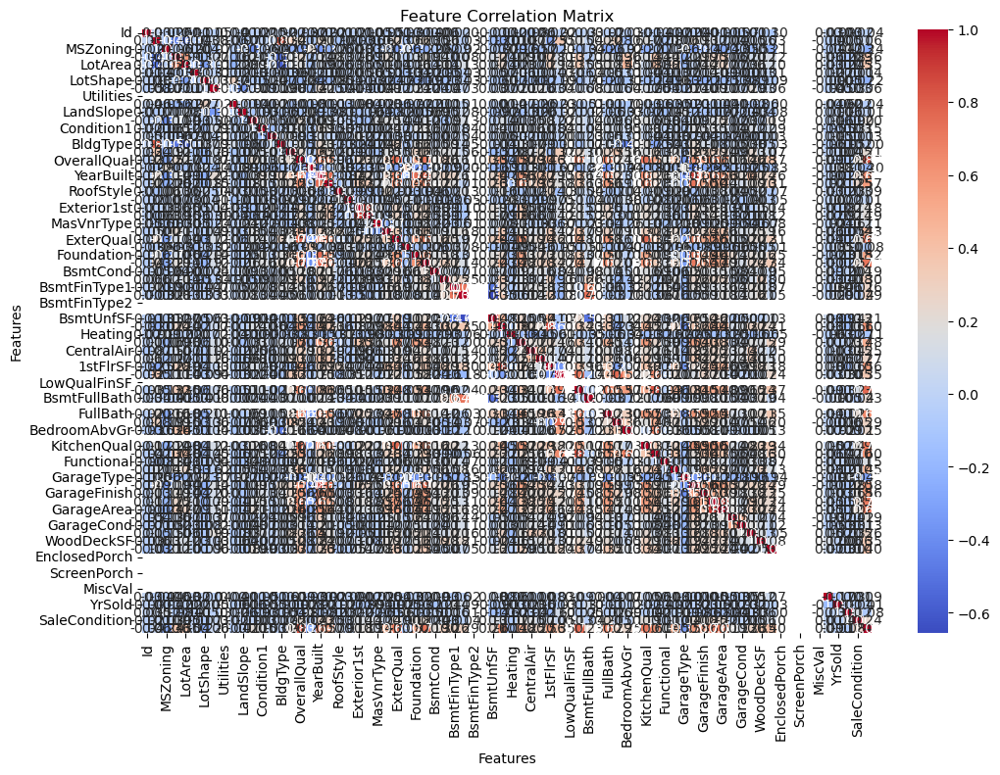

In [29]:
# Collinearity Visualization

# Create Matrix
correlation_matrix = df.corr()

# Set up the matplotlib figure
plt.figure(figsize=(12, 8))

# Draw the heatmap
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)

# Add title and labels to the heatmap
plt.title('Feature Correlation Matrix')
plt.xlabel('Features')
plt.ylabel('Features')

# Show plot
plt.show()

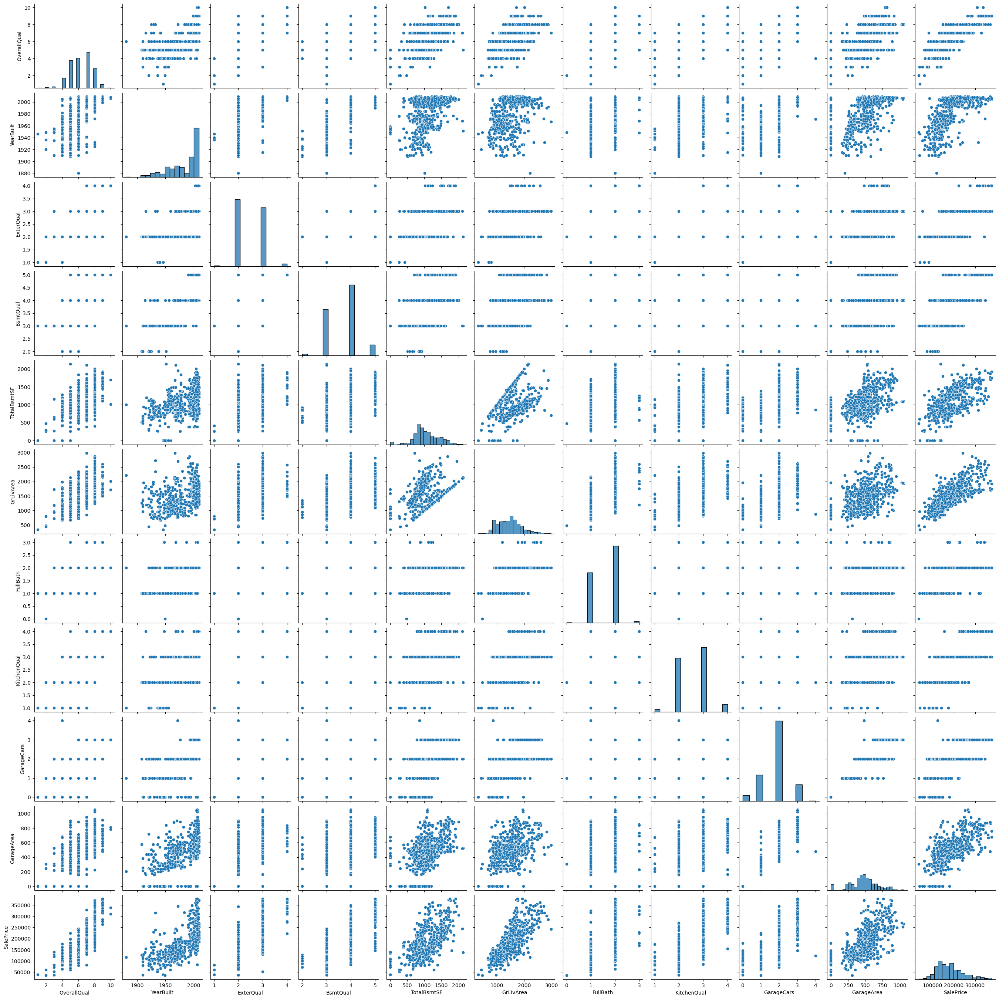

In [31]:
## Above Visualization is useless, must drop features
# Find Features that are correlated with >.50 threshold


corr_matrix = df.corr()

# Setting a threshold for selecting correlated features 
threshold = 0.6


# Finding features that have a correlation above the threshold with 'SalePrice'
high_corr_features = corr_matrix.index[corr_matrix['SalePrice'] > threshold].tolist()


# Check if high_corr_features is not empty
if high_corr_features:
        
    #Create pairplot with the selected features
    sns.pairplot(df, vars=high_corr_features)
        
     # Saving High Res image for easier viewing
    plt.savefig('SalePrice_pairplot_high_res.png', dpi=300)
        
    plt.show()
else:
    print("No highly correlated features found.")

In [32]:
correlated_columns = ['SalePrice',
                      'GarageArea', 
                      'GarageCars', 
                      'GarageFinish', 
                      'GarageYrBlt', 
                      'TotRmsAbvGrd', 
                      'KitchenQual', 
                      'FullBath', 
                      'GrLivArea', 
                      '1stFlrSF', 
                      'TotalBsmtSF', 
                      'BsmtQual', 
                      'Foundation', 
                      'ExterQual', 
                      'YearRemodAdd', 
                      'YearBuilt', 
                      'OverallQual']


df = df[correlated_columns]

df

,SalePrice,GarageArea,GarageCars,GarageFinish,GarageYrBlt,TotRmsAbvGrd,KitchenQual,FullBath,GrLivArea,1stFlrSF,TotalBsmtSF,BsmtQual,Foundation,ExterQual,YearRemodAdd,YearBuilt,OverallQual
0,208500.0,548.0,2.0,2,2003.000000,8.0,3,2.0,1710.0,856.0,856.0,4,2,3,2003.0,2003.0,7.0
2,223500.0,608.0,2.0,2,2001.000000,6.0,3,2.0,1786.0,920.0,920.0,4,2,3,2002.0,2001.0,7.0
4,250000.0,836.0,3.0,2,2000.000000,9.0,3,2.0,2198.0,1145.0,1145.0,4,2,3,2000.0,2000.0,8.0
6,307000.0,636.0,2.0,2,2004.000000,7.0,3,2.0,1694.0,1694.0,1686.0,5,2,3,2005.0,2004.0,8.0
10,129500.0,384.0,1.0,1,1965.000000,5.0,2,1.0,1040.0,1040.0,1040.0,3,1,2,1965.0,1965.0,5.0
11,345000.0,736.0,3.0,3,2005.000000,11.0,4,3.0,2324.0,1182.0,1175.0,5,2,4,2006.0,2005.0,9.0
13,279500.0,840.0,3.0,2,2006.000000,7.0,3,2.0,1494.0,1494.0,1494.0,4,2,3,2007.0,2006.0,7.0
15,132000.0,576.0,2.0,1,1991.000000,5.0,2,1.0,854.0,854.0,832.0,3,0,2,2001.0,1929.0,7.0
18,159000.0,576.0,2.0,1,2004.000000,6.0,3,1.0,1114.0,1114.0,1114.0,3,2,2,2004.0,2004.0,5.0
19,139000.0,294.0,1.0,1,1958.000000,6.0,2,1.0,1339.0,1339.0,1029.0,3,1,2,1965.0,1958.0,5.0


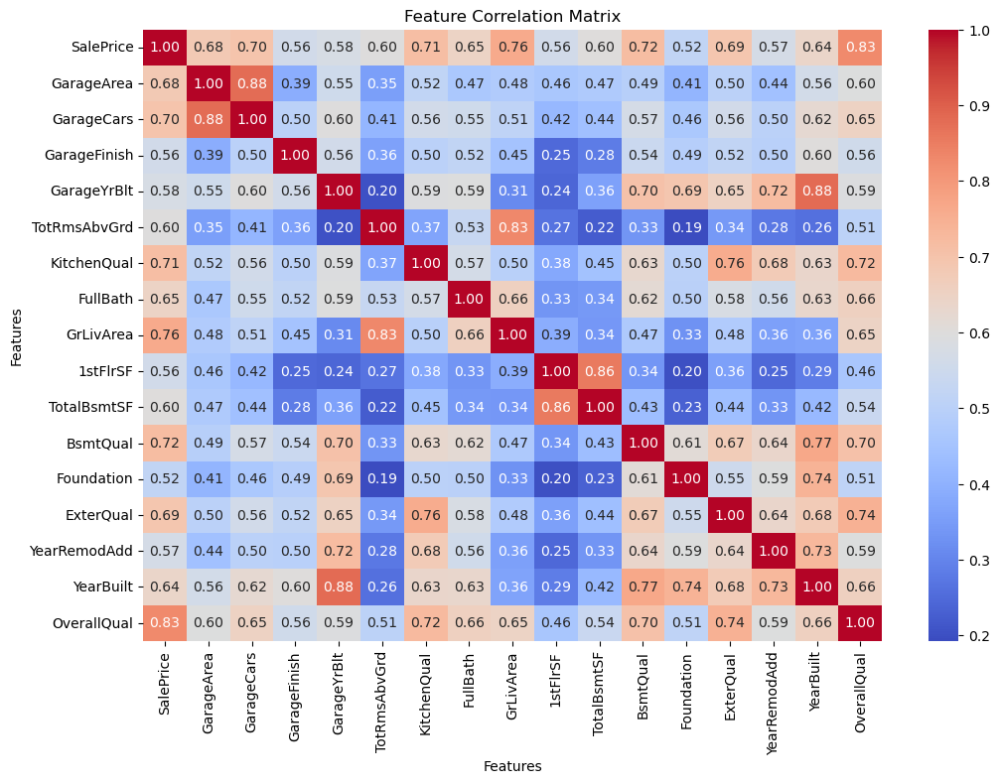

In [33]:
# Collinearity Visualization 2

# Create Matrix
correlation_matrix = df.corr()

# Set up the matplotlib figure
plt.figure(figsize=(12, 8))

# Draw the heatmap
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)

# Add title and labels to the heatmap
plt.title('Feature Correlation Matrix')
plt.xlabel('Features')
plt.ylabel('Features')

# Show plot
plt.show()